In [117]:
import numpy as np
import os
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = False
plt.rcParams['font.size'] = 20
from scipy.stats import expon, exponnorm, gamma, norm
from scipy.optimize import minimize_scalar
import logging


def plot_spectrum_and_histograms(
        freqs,
        spectrum_on,
        spectrum_off,
        time,
        timeseries,
        on,
        num_subbands=4,
        title="Intensity Distribution Analysis",
        fit_mode="emg",                # "tail" | "emg"
        tail_sigma_cut=3.0,             # threshold in units of σ_noise
        bins=120
):
    """
    Multi–panel spectrum + histogram plot with physically-motivated PDF fits.

    Parameters
    ----------
    freqs : 1-D array
        Frequency axis (MHz) for the spectra.
    spectrum_on, spectrum_off : 1-D arrays
        Time-integrated on-pulse / off-pulse spectra (same length as freqs).
    num_subbands : int
        Number of frequency chunks (rows) to display.
    fit_mode : {"tail", "emg"}
        * "tail":   Fit only the positive tail ( > `tail_sigma_cut`·σ_n )
                    with an exponential (N=1) or gamma (shape N>1) PDF.
        * "emg" :   Fit the entire distribution with an exponentially-
                    modified Gaussian (EMG) PDF, fixing σ_n from off-pulse.
    tail_sigma_cut : float
        Threshold, in units of σ_noise, above which samples are considered
        “tail” for the exponential fit.
    bins : int
        Number of histogram bins.
    """
    logging.info(f"[plot]  mode={fit_mode},  sig_cut={tail_sigma_cut} σ,  bins={bins}")

    spectrum_off_shape = savgol_filter(spectrum_off, spectrum_off.shape[0]//4, 3, mode='mirror')
    print(f'Spectrum Off Shape Min/Max: {spectrum_off_shape.min()}, {spectrum_off_shape.max()}')
    spec_on = spectrum_on - spectrum_off_shape
    spec_off = spectrum_off - spectrum_off_shape

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns
    # First subplot (left)
    if len(on) == 2:
        time_lim = time[on[0]:on[1]]
        timeseries_lim = timeseries[on[0]:on[1]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim, timeseries_lim, c='r', alpha=0.5, linewidth=5)
    elif len(on) == 4:
        print('Two components!')
        time_lim_1 = time[on[0]:on[1]]
        time_lim_2 = time[on[2]:on[3]]
        timeseries_lim_1 = timeseries[on[0]:on[1]]
        timeseries_lim_2 = timeseries[on[2]:on[3]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim_1, timeseries_lim_1, c='r', alpha=0.5, linewidth=5)
        axs[0].plot(time_lim_2, timeseries_lim_2, c='r', alpha=0.5, linewidth=5)
    axs[0].set_xlabel('Time (ms)')
    axs[0].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[0].set_xlim((on[0]-50)*32.768e-3, (on[-1]+50)*32.768e-3)

    # Second subplot (right)
    # (You can add another plot here, or repeat the same as above for demonstration)
    axs[1].plot(freqs, spectrum_off, c='k', label='Off-pulse Spectrum')
    axs[1].plot(freqs, spectrum_off_shape, c='r', alpha=0.5)
    axs[1].set_xlabel('Frequency (MHz)')
    axs[1].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[1].set_xlim(1311.25, 1498.75)
    axs[1].legend(frameon=False, fontsize=14, loc='upper right')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(num_subbands, 2,
                             figsize=(25, 15),
                             width_ratios=[1.0, 0.22])
    fig.suptitle(title, fontsize=22)

    # --- chunk the band ----------------------------------------------------
    edges = np.linspace(0, len(freqs), num_subbands + 1, dtype=int)

    for i in range(num_subbands):
        lo, hi = edges[i], edges[i + 1]
        ax_spec, ax_hist = axes[i]

        # -------------------------------------------------------------------
        # 1.  Extract sub-band and clean NaNs
        spec_on_chunk  = np.asarray(spec_on[lo:hi],  dtype=float)
        spec_off_chunk = np.asarray(spec_off[lo:hi], dtype=float)
        mask_on  = np.isfinite(spec_on_chunk)
        mask_off = np.isfinite(spec_off_chunk)
        spec_on_chunk  = spec_on_chunk[mask_on]
        spec_off_chunk = spec_off_chunk[mask_off]
        freq_chunk     = freqs[lo:hi][mask_on] if mask_on.any() else freqs[lo:hi]

        if len(spec_on_chunk) < 10 or len(spec_off_chunk) < 10:
            logging.warning(f"Sub-band {i+1}: too few points, skipped.")
            continue

        # -------------------------------------------------------------------
        # 2.  Baseline & noise statistics
        noise_mean = np.nanmean(spec_off_chunk)
        sigma_n    = np.nanstd(spec_off_chunk, ddof=1)

        spec_on_d = spec_on_chunk  - noise_mean      # de-mean
        spec_off_d = spec_off_chunk - noise_mean

        # quick modulation-index check
        m = np.nanstd(spec_on_d) / np.nanmean(spec_on_d)
        logging.debug(f"Sub-band {i+1}:  σ_n={sigma_n:.3g},   m={m:.2f}")

        # -------------------------------------------------------------------
        # 3.  Spectrum panel
        offset = 4 * sigma_n
        ax_spec.step(freq_chunk, spec_on_d,            color='k', label='On-pulse')
        ax_spec.step(freq_chunk, spec_off_d - offset,  color='m', alpha=0.6,
                     label=f'Off-pulse')
        ax_spec.axhline(0,        color='k', ls=':', alpha=0.4)
        ax_spec.axhline(-offset,  color='m', ls=':', alpha=0.4)
        ax_spec.set_xlim(freq_chunk.min(), freq_chunk.max())
        ax_spec.set_ylim(1.1 * spec_off_d.min() - offset,
                         1.3 * spec_on_d.max())
        ax_spec.set_ylabel("Intensity", fontsize=16)
        ax_spec.legend(frameon=False, fontsize=14, loc='upper right')
        #if i < num_subbands - 1:
        #    ax_spec.set_xticklabels([])

        # -------------------------------------------------------------------
        # 4.  Histogram panel  (density=True)
        h_on,  edges_on,  _ = ax_hist.hist(spec_on_d,  bins=bins,
                                           density=True, histtype='step',
                                           color='k', lw=2, label='Signal')
        h_off, edges_off, _ = ax_hist.hist(spec_off_d, bins=bins,
                                           density=True, histtype='step',
                                           color='m', lw=2, ls='--', label='Noise')

        x_plot = np.linspace(min(edges_on[0], edges_off[0]),
                             max(edges_on[-1], edges_off[-1]),
                             400)
        binw = edges_on[1] - edges_on[0]      # same bin-width for density

        # -------------------------------------------------------------------
        # 5.  PDF fit & overlay
        if fit_mode.lower() == "tail":
            # -- pick the high-tail samples
            thresh = tail_sigma_cut * sigma_n
            tail   = spec_on_d[spec_on_d > thresh]
            if len(tail) < 10:
                logging.warning(f"Sub-band {i+1}: tail <10 pts, skipping fit.")
            else:
                tau_hat = tail.mean()                 # MLE for exponential
                pdf     = expon(scale=tau_hat).pdf(x_plot)
                ax_hist.plot(x_plot, pdf, 'g-', lw=2,
                             label=fr'Exp tail  ($\tau={tau_hat:.2f}$)')
                
        elif fit_mode.lower() == "emg":
            # --------------------------------------------------------------
            # EMG fit with free loc (offset) and K = τ/σ_n
            from scipy.optimize import minimize            # make sure imported
            samples = spec_on_d                            # baseline-subtracted

            def nll(params, samples, sigma):
                loc, k = params           # loc = mean offset, k = τ / σ_n
                if k <= 0:                # guard against illegal K
                    return np.inf
                return -np.sum(exponnorm.logpdf(samples,
                                                K=k,
                                                loc=loc,
                                                scale=sigma))

            # reasonable initial guesses:
            p0 = [np.median(samples), 1.0]
            bounds = [(-np.inf, np.inf), (1e-3, 50)]       # loc free, K>0
            res = minimize(nll, p0,
                           args=(samples, sigma_n),
                           bounds=bounds,
                           method="L-BFGS-B")

            loc_hat, K_hat = res.x
            tau_hat = K_hat * sigma_n

            pdf = exponnorm.pdf(x_plot, K_hat,
                                loc=loc_hat,
                                scale=sigma_n)
            ax_hist.plot(x_plot, pdf, 'g-', lw=2,
                         label=fr'EMG $(\tau={tau_hat:.2f},\,\sigma={sigma_n:.2f},\,\mathrm{{loc}}={loc_hat:.2f})$')

        else:
            raise ValueError("fit_mode must be 'tail' or 'emg'")

        # -------------------------------------------------------------------
        # 6.  Gaussian noise overlay
        pdf_noise = norm(scale=sigma_n).pdf(x_plot)
        ax_hist.plot(x_plot, pdf_noise, 'r:', lw=2,
                     label=fr'Noise $N(0,{sigma_n:.2f}^2)$')

        # -------------------------------------------------------------------
        # 7.  styling
        ax_hist.set_yscale('log')
        ax_hist.set_ylim(1e-4, 1e-1)
        #ax_hist.set_xlabel(r"Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)", fontsize=15)
        #if i == num_subbands // 2:
        ax_hist.set_ylabel("PDF", fontsize=15)
        #ax_hist.legend(frameon=False, fontsize=13)
        ax_hist.legend(frameon=False, fontsize=17, bbox_to_anchor=(1.15, 0.5, 0.5, 0.5))

    axes[-1, 1].set_xlabel(r"Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)", fontsize=15)
    axes[-1, 0].set_xlabel("Frequency (MHz)", fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.965])
    plt.show()


In [118]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from scipy.fft import rfft, irfft
from scipy.stats   import expon, exponnorm, gamma, norm
from scipy.optimize import minimize, minimize_scalar
import logging


def gamma_plus_exp_pdf(x, k, loc, theta, tau, dx=0.1):
    # build a fine grid
    x_max = x.max()*1.2
    grid  = np.arange(0, x_max, dx)
    g_noise = gamma.pdf(grid, a=k,   loc=loc, scale=theta)
    g_sig   = expon.pdf(grid,        scale=tau)
    conv    = irfft(rfft(g_noise) * rfft(g_sig)) * dx
    return np.interp(x, grid, conv[:len(grid)])

def _best_noise_model(samples):
    """
    Decide between Gaussian and Gamma noise.
    Returns ('gauss', (mu, sigma))  or  ('gamma', (k, theta)).
    """
    samples = np.asarray(samples, dtype=float)
    pos     = samples[samples > 0]                 # needed for Gamma fit
    if len(pos) < 10:                              # too few positives
        mu, sig = norm.fit(samples)
        return 'gauss', (mu, sig)

    # Gaussian  (fit and LL on *same* positive subset) -----------------
    mu_g, sig_g = norm.fit(pos)
    ll_gauss    = norm.logpdf(pos, loc=mu_g, scale=sig_g).sum()
    aic_gauss   = 4 - 2 * ll_gauss                 # k=2 → 2*k = 4

    # Gamma ------------------------------------------------------------
    k_g, loc_g, th_g = gamma.fit(pos, floc=0)
    ll_gamma   = gamma.logpdf(pos, a=k_g, loc=0, scale=th_g).sum()
    aic_gamma  = 4 - 2 * ll_gamma

    return ('gauss', (mu_g, sig_g)) if aic_gauss < aic_gamma \
           else ('gamma', (k_g, th_g))


def plot_spectrum_and_histograms(
        freqs, spectrum_on, spectrum_off,
        time, timeseries, on,
        num_subbands=4,
        title="Intensity Distribution Analysis",
        fit_mode="emg",        # "auto" | "tail" | "emg"
        tail_sigma_cut=3.0,
        bins=60
):
    logging.info(f"[plot]  mode={fit_mode}, tail>{tail_sigma_cut}σ, bins={bins}")

    # --- coarse additive baseline from the OFF spectrum -----------------
    off_baseline = savgol_filter(spectrum_off,
                                 spectrum_off.size, 3, mode='mirror')
    spec_on  = spectrum_on  #- off_baseline
    spec_off = spectrum_off #- off_baseline

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns
    # First subplot (left)
    if len(on) == 2:
        time_lim = time[on[0]:on[1]]
        timeseries_lim = timeseries[on[0]:on[1]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim, timeseries_lim, c='r', alpha=0.5, linewidth=5)
    elif len(on) == 4:
        print('Two components!')
        time_lim_1 = time[on[0]:on[1]]
        time_lim_2 = time[on[2]:on[3]]
        timeseries_lim_1 = timeseries[on[0]:on[1]]
        timeseries_lim_2 = timeseries[on[2]:on[3]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim_1, timeseries_lim_1, c='r', alpha=0.5, linewidth=5)
        axs[0].plot(time_lim_2, timeseries_lim_2, c='r', alpha=0.5, linewidth=5)
    axs[0].set_xlabel('Time (ms)')
    axs[0].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[0].set_xlim((on[0]-50)*32.768e-3, (on[-1]+50)*32.768e-3)

    # Second subplot (right)
    # (You can add another plot here, or repeat the same as above for demonstration)
    axs[1].plot(freqs, spectrum_off, c='k', label='Off-pulse Spectrum')
    axs[1].plot(freqs, off_baseline, c='r', alpha=0.5)
    axs[1].set_xlabel('Frequency (MHz)')
    axs[1].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[1].set_xlim(1311.25, 1498.75)
    axs[1].legend(frameon=False, fontsize=14, loc='upper right')

    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(num_subbands, 2,
                             figsize=(25, 15), width_ratios=[1.0, 0.25])
    fig.suptitle(title, fontsize=22)

    edges = np.linspace(0, len(freqs), num_subbands + 1, dtype=int)

    for i in range(num_subbands):
        lo, hi = edges[i], edges[i + 1]
        ax_spec, ax_hist = axes[i]

        # ---- 1. slice clean -------------------------------------------
        on_chunk  = np.asarray(spec_on[lo:hi], dtype=float)
        off_chunk = np.asarray(spec_off[lo:hi], dtype=float)
        good_on, good_off = np.isfinite(on_chunk), np.isfinite(off_chunk)
        if good_on.sum() < 10 or good_off.sum() < 10:
            logging.warning(f"Sub-band {i+1}: too few good points → skipped")
            continue
        on_chunk, off_chunk = on_chunk[good_on], off_chunk[good_off]
        freq_chunk          = freqs[lo:hi][good_on]

        noise_type, noise_pars = _best_noise_model(off_chunk)
        logging.debug(f"Sub-band {i+1}: noise={noise_type}, pars={noise_pars}")

        # ---- 2. subtract off-pulse mean & measure σ -------------------
        if noise_type == 'gauss':
            noise_mean = off_chunk.mean()
            sigma_n    = off_chunk.std(ddof=1)
            spec_on_d  = on_chunk  - noise_mean
            spec_off_d = off_chunk - noise_mean
            samples    = spec_on_d
        else:  # gamma noise
            noise_mean = off_chunk.mean()
            spec_on_d  = on_chunk  - noise_mean
            spec_off_d = off_chunk - noise_mean
            samples    = spec_on_d

            # --- shifted Gamma noise fit -----------------------------------
            k_noise, loc_noise, theta = gamma.fit(spec_off_d)
            sigma_n = np.sqrt(k_noise) * theta        # plotting offset only

            #k_noise, theta = noise_pars
            #spec_on_d  = on_chunk                  # ≥0
            #spec_off_d = off_chunk
            #samples    = spec_on_d
            #sigma_n    = np.sqrt(k_noise) * theta  # for offset plotting

        # ---- 5. histogram --------------------------------------------
        h_on, e_on,  _ = ax_hist.hist(samples,    bins=bins, density=True,
                                      histtype='step', color='k', lw=2,
                                      label='Signal')
        h_off,e_off, _ = ax_hist.hist(spec_off_d, bins=bins, density=True,
                                      histtype='step', color='m', lw=2, ls='--',
                                      label='Noise')
        x_plot = np.linspace(min(e_on[0], e_off[0]),
                             max(e_on[-1], e_off[-1]), 400)

        # ---- 6. choose on-pulse fit branch ---------------------------
        if noise_type == 'gauss':
            # 6a. Gaussian noise → use your EMG / tail logic ------------
            if fit_mode in ("tail", "auto") and fit_mode != "emg":
                tail = samples[samples > tail_sigma_cut*sigma_n]
                if len(tail) >= 10:
                    tau_hat = tail.mean()
                    ax_hist.plot(x_plot, expon(scale=tau_hat).pdf(x_plot),
                                 'g-', lw=2, 
                                 label=rf'exp-tail ($\tau={tau_hat:.2f}$)')
            else:  # EMG
                def nll(par):
                    loc, k = par
                    if k <= 0: return np.inf
                    return -exponnorm.logpdf(samples, K=k,
                                             loc=loc, scale=sigma_n).sum()
                res = minimize(nll, x0=[np.median(samples), 1.0],
                               bounds=[(-np.inf, np.inf), (1e-3, 50)],
                               method='L-BFGS-B')
                loc_hat, K_hat = res.x
                tau_hat = K_hat * sigma_n
                ax_hist.plot(x_plot,
                             exponnorm.pdf(x_plot, K_hat,
                                           loc=loc_hat, scale=sigma_n),
                             'g-', lw=2,
                             label=rf'EMG ($\tau={tau_hat:.2f}$, '
                                   rf'σ={sigma_n:.2f}, loc={loc_hat:.2f})')
            # noise overlay
            mu, sig = noise_pars
            ax_hist.plot(x_plot, norm(mu, sig).pdf(x_plot),
                         'r:', lw=2, label='Noise Gaussian')
        else:
            # --- Γ ⊕ Exp convolution fit (τ only) ---------------------------
            def nll_tau(tau):
                if tau <= 0:
                    return np.inf
                pdf = gamma_plus_exp_pdf(samples, k_noise,
                                        loc_noise, theta, tau)
                return -np.sum(np.log(pdf + 1e-300))

            tau_hat = minimize_scalar(nll_tau,
                                    bounds=(0.1*theta, 100*theta),
                                    method='bounded').x

            # plot on-pulse PDF
            ax_hist.plot(x_plot,
                        gamma_plus_exp_pdf(x_plot, k_noise, loc_noise,
                                            theta, tau_hat),
                        'g-', lw=2,
                        label=rf'Γ⊕Exp ($\tau={tau_hat:.1f}$, '
                            rf'$k={k_noise:.1f}$, θ={theta:.2f}, '
                            rf'loc={loc_noise:.1f})')

            # noise overlay
            ax_hist.plot(x_plot,
                        gamma.pdf(x_plot, a=k_noise, loc=loc_noise, scale=theta),
                        'r--', lw=2, label='Noise Γ')
            
        # ---- 6. spectrum panel (uses sigma_n, spec_on_d) -------------
        offset = 4*sigma_n
        ax_spec.step(freq_chunk, spec_on_d,           color='k', label='On')
        ax_spec.step(freq_chunk, spec_off_d-offset,   color='m', alpha=0.6,
                     label='Off (shifted)')
        ax_spec.axhline(0,        color='k', ls=':', alpha=0.4)
        ax_spec.axhline(-offset,  color='m', ls=':', alpha=0.4)
        ax_spec.set_xlim(freq_chunk.min(), freq_chunk.max())
        ax_spec.set_ylim(-offset-2*sigma_n,
                         np.percentile(spec_on_d, 99)*1.2)
        #if i < num_subbands-1:
        #    ax_spec.set_xticklabels([])
        ax_spec.legend(frameon=False, fontsize=12)

        # ---- 7. style -----------------------------------------------
        ax_hist.set_yscale('log')
        y_max = max(h_on.max(), h_off.max())
        ax_hist.set_ylim(y_max*1e-4, y_max*1.2)
        if i == num_subbands//2:
            ax_hist.set_ylabel("PDF", fontsize=14)
        ax_hist.legend(frameon=False, fontsize=11)

    axes[-1, 0].set_xlabel("Frequency (MHz)", fontsize=15)
    axes[-1, 1].set_xlabel(r"$I - \langle I\rangle_{\rm off}$", fontsize=15)
    fig.tight_layout(rect=[0, 0, 1, 0.965])
    plt.show()


In [135]:
import os
import logging
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter, fftconvolve, medfilt 
from scipy.fft   import rfft, irfft
from scipy.stats import expon, exponnorm, gamma, norm
from scipy.optimize import minimize, minimize_scalar
from scipy.ndimage import median_filter



# ------------------------------------------------------------------ #
# helpers
# ------------------------------------------------------------------ #
def gamma_plus_exp_pdf(x, k, loc, theta, tau, dx=0.05):
    """
    Linear convolution of a shifted Γ(k,loc,θ) with Exp(scale=tau).
    Works whether loc is positive or negative.
    """
    # 1. grid must cover the *full* support of the shifted Gamma
    x_min = loc
    x_max = x.max()*1.2 + 6*tau          # generous tail room
    grid  = np.arange(x_min, x_max, dx)

    g_noise = gamma.pdf(grid, a=k, loc=loc, scale=theta)
    g_sig   = expon.pdf(grid - grid[0], scale=tau)  # centred at 0
    conv    = fftconvolve(g_noise, g_sig) * dx

    grid_conv = np.arange(conv.size) * dx + x_min  # align to loc
    return np.interp(x, grid_conv, conv)


def _best_noise_model(samples):
    """Return ('gauss',(μ,σ)) or ('gamma',(k,θ))."""
    samples = np.asarray(samples, float)
    pos     = samples[samples > 0]           # Gamma needs positives
    if len(pos) < 10:
        return 'gauss', norm.fit(samples)

    # Gaussian LL on the full sample
    mu_g, sig_g = norm.fit(samples)
    ll_gauss    = norm.logpdf(samples, loc=mu_g, scale=sig_g).sum()
    aic_gauss   = 4 - 2*ll_gauss               # 2*k with k=2

    # Gamma LL on positives
    k_g, loc_g, th_g = gamma.fit(pos, floc=0)
    ll_gamma   = gamma.logpdf(pos, a=k_g, loc=0, scale=th_g).sum()
    aic_gamma  = 4 - 2*ll_gamma

    return ('gauss', (mu_g, sig_g)) if aic_gauss < aic_gamma \
           else ('gamma', (k_g, th_g))
# ------------------------------------------------------------------ #


def plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off,
                                 time, timeseries, on,
                                 num_subbands=4,
                                 title="Intensity Distribution Analysis",
                                 fit_mode="emg", tail_sigma_cut=3.0,
                                 bins=250, save_path=None):
    """
    Multi-panel spectrum + histogram plot.

    Gaussian noise  → EMG or tail fit.
    Gamma   noise   → shifted-Γ noise plus Γ⊗Exp burst convolution.
    """
    logging.info(f"[plot] mode={fit_mode}, tail>{tail_sigma_cut}σ, bins={bins}")

    # --- coarse additive baseline from the OFF spectrum -----------------
    #off_baseline = savgol_filter(spectrum_off,
    #                             spectrum_off.size//4, 3, mode='mirror')
    spec_on  = spectrum_on  #/ medfilt(spectrum_off, kernel_size=7) #- off_baseline
    spec_off = spectrum_off #/ medfilt(spectrum_off, kernel_size=7) #- off_baseline

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns
    # First subplot (left)
    if len(on) == 2:
        time_lim = time[on[0]:on[1]]
        timeseries_lim = timeseries[on[0]:on[1]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim, timeseries_lim, c='r', alpha=0.5, linewidth=5)
    elif len(on) == 4:
        print('Two components!')
        time_lim_1 = time[on[0]:on[1]]
        time_lim_2 = time[on[2]:on[3]]
        timeseries_lim_1 = timeseries[on[0]:on[1]]
        timeseries_lim_2 = timeseries[on[2]:on[3]]
        axs[0].plot(time, timeseries, c='k')
        axs[0].plot(time_lim_1, timeseries_lim_1, c='r', alpha=0.5, linewidth=5)
        axs[0].plot(time_lim_2, timeseries_lim_2, c='r', alpha=0.5, linewidth=5)
    axs[0].set_xlabel('Time (ms)')
    axs[0].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[0].set_xlim((on[0]-50)*32.768e-3, (on[-1]+50)*32.768e-3)

    # Second subplot (right)
    # (You can add another plot here, or repeat the same as above for demonstration)
    axs[1].plot(freqs, spectrum_off, c='k', label='Off-pulse Spectrum')
    #axs[1].plot(freqs, off_baseline, c='r', alpha=0.5)
    axs[1].set_xlabel('Frequency (MHz)')
    axs[1].set_ylabel('Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axs[1].set_xlim(1311.25, 1498.75)
    axs[1].legend(frameon=False, loc='upper right')

    fig.suptitle(title, fontsize=22, y=0.95)
    plt.tight_layout()
    plt.show()

    # main figure
    fig, axes = plt.subplots(num_subbands, 2, figsize=(25, 15),
                             width_ratios=[1, 0.4])
    fig.suptitle(title, y=0.95)
    edges = np.linspace(0, len(freqs), num_subbands+1, dtype=int)

    for i in range(num_subbands):
        lo, hi = edges[i], edges[i+1]
        ax_s, ax_h = axes[i]

        # slice & clean
        on_chunk  = spec_on [lo:hi]; off_chunk = spec_off[lo:hi]
        mask      = np.isfinite(on_chunk) & np.isfinite(off_chunk)
        if mask.sum() < 10: continue
        on_chunk, off_chunk = on_chunk[mask], off_chunk[mask]
        f_chunk            = freqs[lo:hi][mask]

        # decide noise family
        n_type, n_pars = _best_noise_model(off_chunk)
        logging.debug(f"Band {i+1}: noise={n_type}, pars={n_pars}")

        # subtract off-pulse mean for both families
        noise_mean = off_chunk.mean()
        spec_on_d  = on_chunk  - noise_mean
        spec_off_d = off_chunk - noise_mean
        samples    = spec_on_d

        if n_type == 'gauss':
            mu, sig = n_pars
            sigma_n = sig
        else:  # gamma
            k_noise, loc_noise, theta = gamma.fit(spec_off_d)
            sigma_n = np.sqrt(k_noise) * theta

        # histogram
        h_on,  e_on,  _ = ax_h.hist(samples,   bins=bins, density=True,
                                    histtype='step', lw=4, color='k', alpha=0.3,
                                    label='Signal')
        h_off, e_off, _ = ax_h.hist(spec_off_d, bins=bins, density=True,
                                    histtype='step', lw=4, color='m', alpha=0.3,
                                    label='Noise')
        x_plot = np.linspace(min(e_on[0], e_off[0]),
                             max(e_on[-1], e_off[-1]), 400)

        # fit & plot
        if n_type == 'gauss':
            # EMG or tail
            if fit_mode == 'tail':
                tail = samples[samples > tail_sigma_cut*sigma_n]
                if len(tail) >= 10:
                    tau = tail.mean()
                    ax_h.plot(x_plot, expon(scale=tau).pdf(x_plot),
                              'k--', lw=4, label=rf'exp-tail (τ={tau:.1f})')
            else:
                def nll(p):
                    loc, k = p
                    if k <= 0: return np.inf
                    return -exponnorm.logpdf(samples, K=k,
                                             loc=loc, scale=sigma_n).sum()
                loc_hat, K_hat = minimize(nll, [np.median(samples), 1],
                                          bounds=[(-np.inf, np.inf),
                                                  (1e-3, 50)]).x
                tau = K_hat * sigma_n
                ax_h.plot(x_plot,
                          exponnorm.pdf(x_plot, K_hat,
                                        loc=loc_hat, scale=sigma_n),
                          'k--', lw=4,
                          label=rf'EMG (τ={tau:.1f}, σ={sigma_n:.1f})')
            # noise overlay
            ax_h.plot(x_plot, norm(*n_pars).pdf(x_plot),
                      'm--', lw=4, label='Noise Gaussian')

        else:  # Gamma noise  →  Γ⊕Exp convolution
            def nll_tau(tau):
                return (np.inf if tau <= 0 else
                        -np.sum(np.log(gamma_plus_exp_pdf(samples,
                                                          k_noise, loc_noise,
                                                          theta, tau) + 1e-300)))
            tau_hat = minimize_scalar(nll_tau,
                                      bounds=(0.1*theta, 100*theta),
                                      method='bounded').x
            
            N_hat = tau_hat / theta
            m_hat = np.sqrt(theta / tau_hat)

            ax_h.plot(x_plot,
                      gamma_plus_exp_pdf(x_plot, k_noise, loc_noise,
                                         theta, tau_hat),
                      'k--', lw=4,
                      label=rf'Γ $\ast$ exp (τ={tau_hat:.1f}, k={k_noise:.1f})')
            ax_h.plot(x_plot,
                      gamma.pdf(x_plot, a=k_noise, loc=loc_noise,
                                scale=theta),
                      'm--', lw=4, label=rf'Noise Γ (θ={theta:.1f})')
            
            ax_h.plot([], [], ' ',   # dummy handle, just for the legend
                        label=rf'$N={N_hat:.1f}$,  $m={m_hat:.2f}$')

        # spectrum panel
        offset = 4*sigma_n
        ax_s.step(f_chunk, spec_on_d, 'k', label='On', linewidth=1)
        ax_s.step(f_chunk, spec_off_d-offset, 'm', alpha=0.6, label='Off', linewidth=1)
        ax_s.axhline(0, ls=':', color='k')
        ax_s.axhline(-offset, ls=':', color='m')
        #ax_s.set_ylabel(r'Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
        ax_s.set_xlim(f_chunk.min(), f_chunk.max())
        ax_s.set_ylim(-offset-2*sigma_n, np.max(spec_on_d)*1.2)
        #if i < num_subbands-1: ax_s.set_xticklabels([])
        ax_s.legend(frameon=True, facecolor='white', edgecolor='none', framealpha=0.5, loc='upper right', fontsize=15)

        # styling
        ax_h.set_yscale('log')
        ax_h.set_ylim(max(h_on.max(), h_off.max())*1e-4,
                      max(h_on.max(), h_off.max())*1.2)
        #if i == num_subbands//2:
        ax_h.set_ylabel('PDF')
        ax_h.legend(frameon=False, bbox_to_anchor=(1.05, 0.5, 0.5, 0.5))

    axes[-1,0].set_xlabel('Frequency (MHz)')
    fig.supylabel(r'Intensity ($I(\nu)-\langle I\rangle_{\mathrm{off}}$)')
    axes[-1,1].set_xlabel(r'$I - \langle I\rangle_{\rm off}$')
    fig.tight_layout(rect=[0, 0, 1, 0.96])
    fig.savefig(os.path.join("/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/figures", save_path))
    plt.show()


/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/4075996148.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/4075996148.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i,:off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


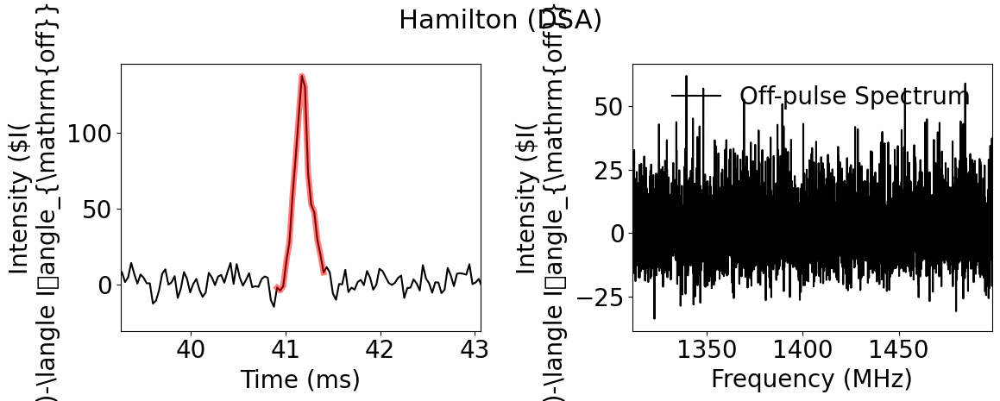

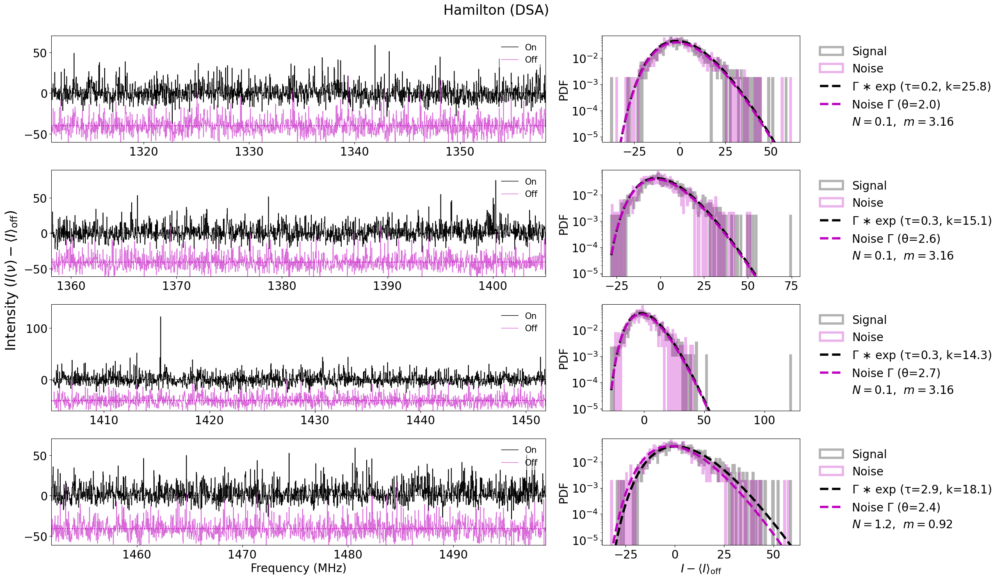

In [136]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/hamilton.npz')
data = npz['power_2d']

on = [1248, 1264]
off = [115, 131]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i,:off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Hamilton (DSA)", save_path="hamilton_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/994173189.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd


Chunks: [   0 1536 3072 4608 6144]
Two components!


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


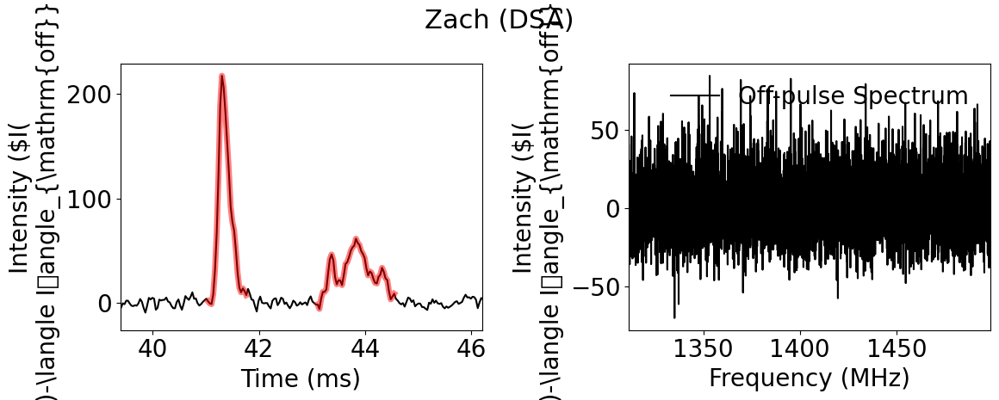

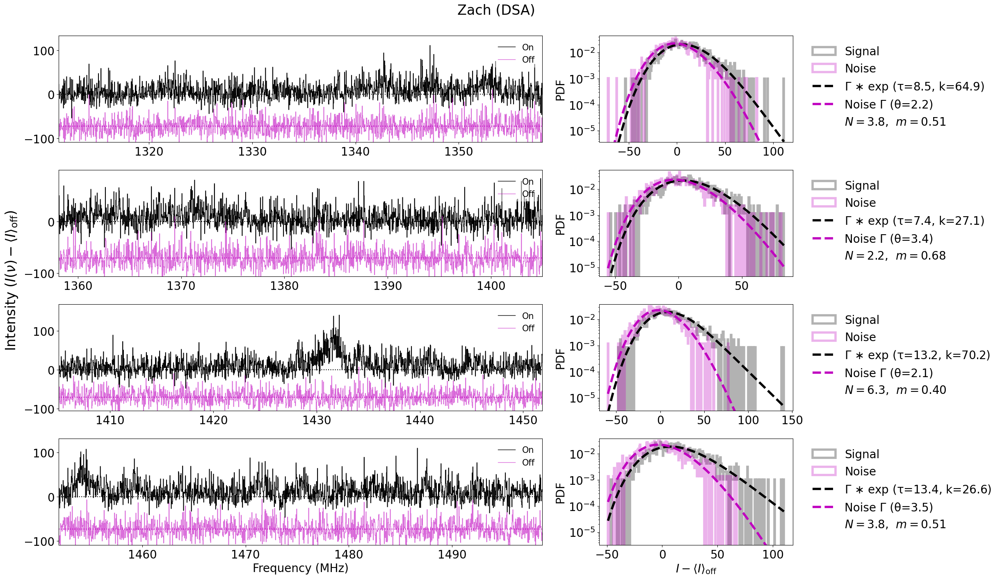

In [137]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/zach.npz')
data = npz['power_2d']

on = [1252, 1275, 1315, 1360]
off = [114, 182]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i,:off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on_1 = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_on_2 = np.nansum(data_bpc[:, on[2]:on[3]],axis=1)
spectrum_on = np.add(spectrum_on_1, spectrum_on_2)

spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Zach (DSA)", save_path="zach_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/2063552269.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/2063552269.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


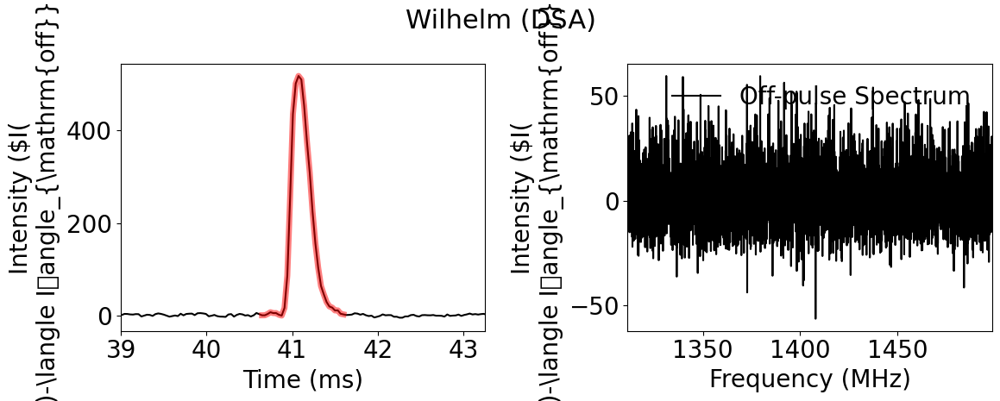

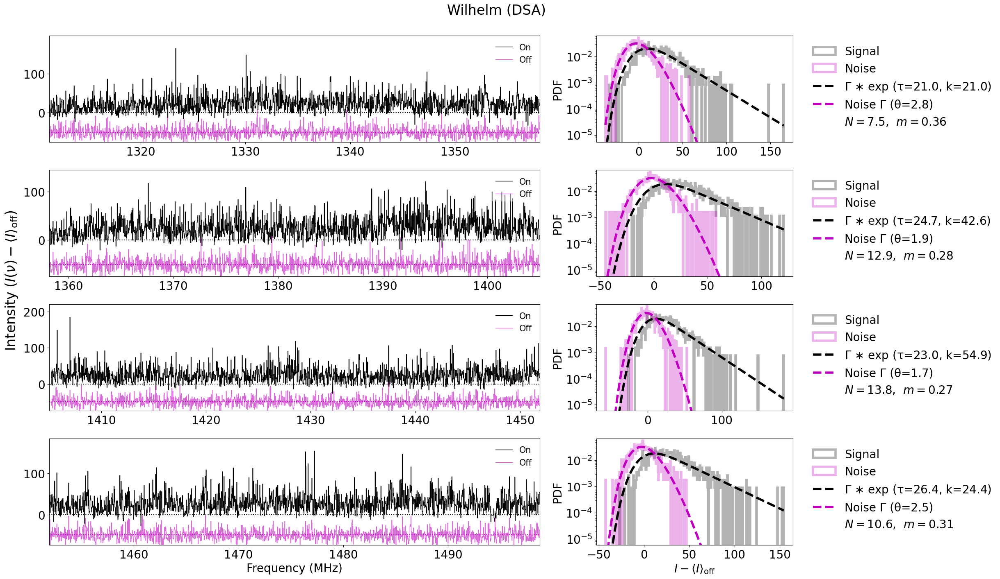

In [138]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/wilhelm.npz')
data = npz['power_2d']

on = [1240, 1270]
off = [100, 130]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Wilhelm (DSA)", save_path="wilhelm_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/1370255081.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/1370255081.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


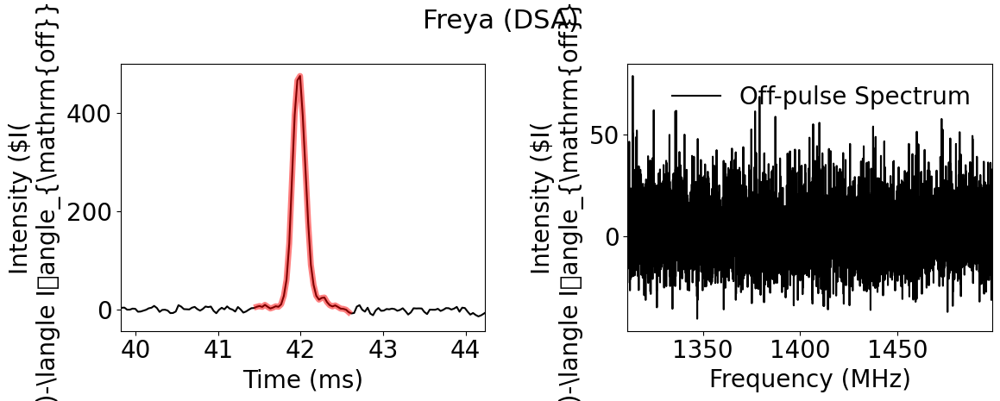

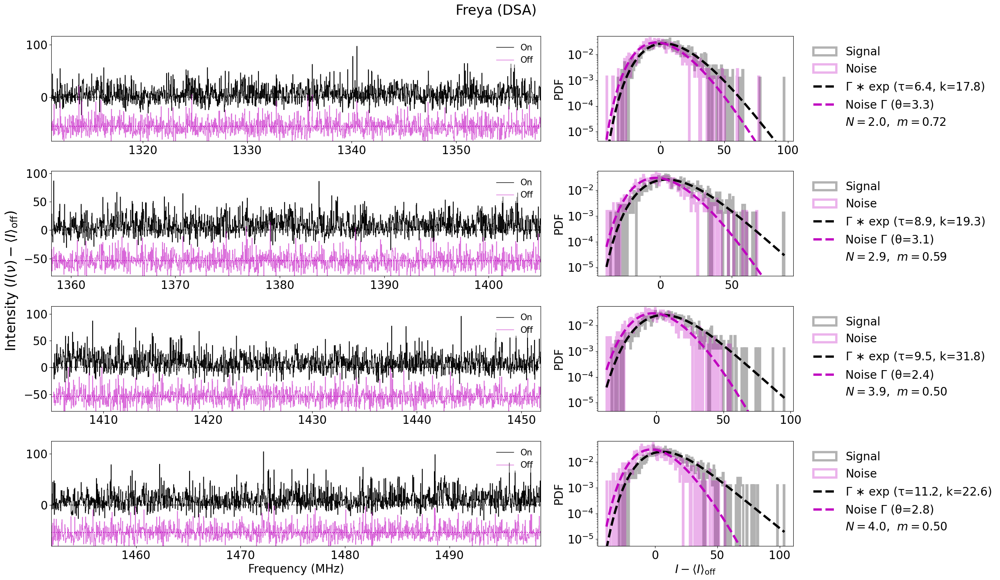

In [139]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/freya.npz')
data = npz['power_2d']

on = [1265, 1300]
off = [105, 140]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Freya (DSA)", save_path="freya_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/284582177.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/284582177.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


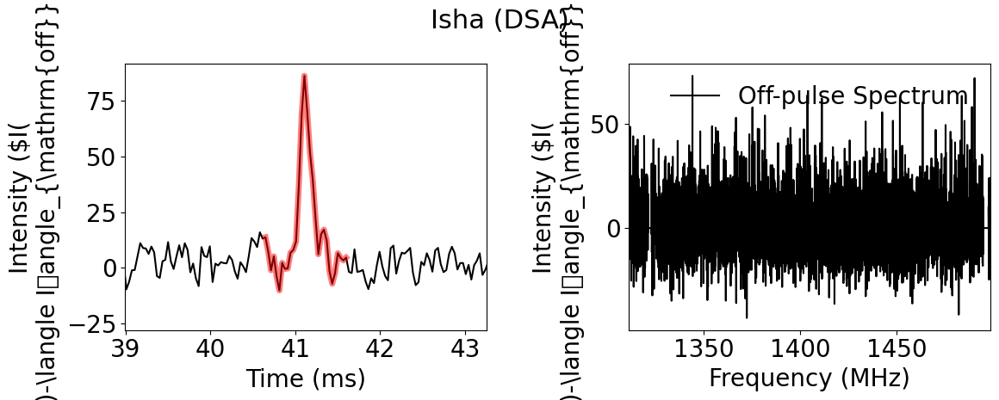

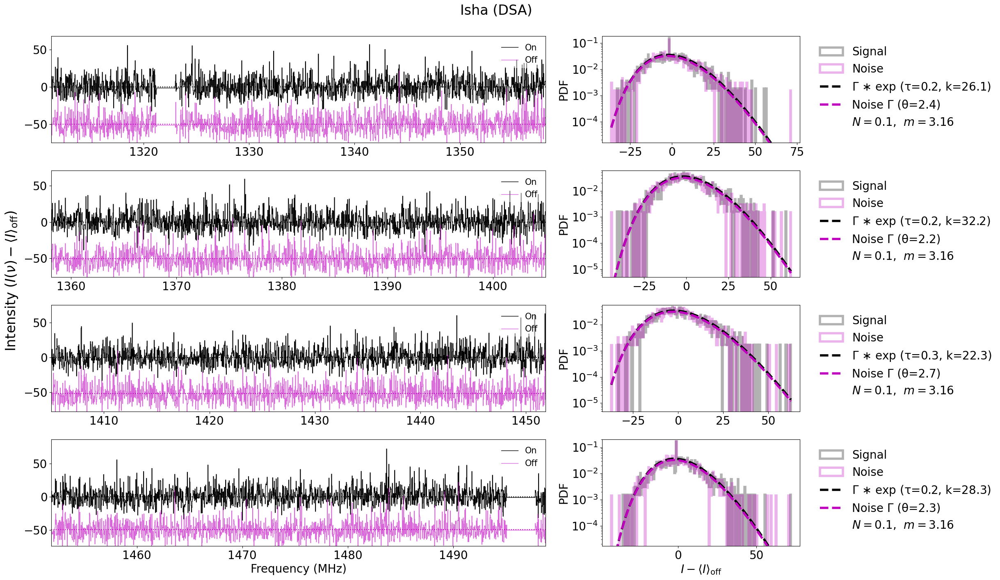

In [140]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/isha.npz')
data = npz['power_2d']

on = [1240, 1270]
off = [110, 140]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1) 

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Isha (DSA)", save_path="isha_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3969691111.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3969691111.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


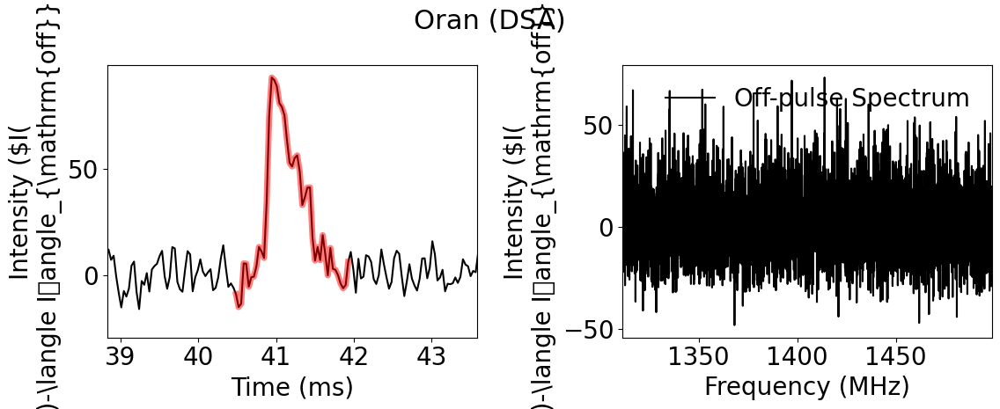

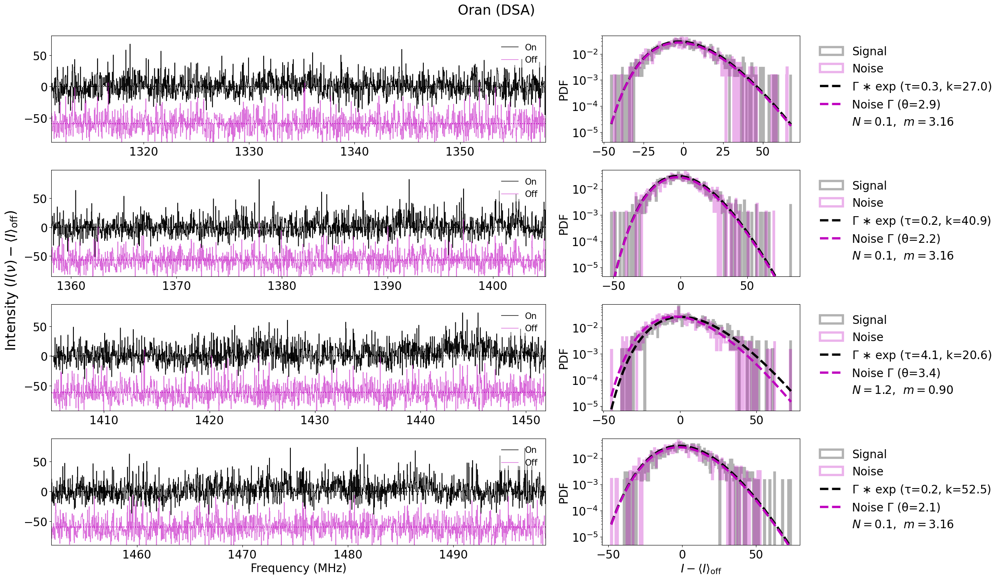

In [141]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/oran.npz')
data = npz['power_2d']

on = [1235, 1280]
off = [100, 145]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Oran (DSA)", save_path="oran_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/4143237616.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/4143237616.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


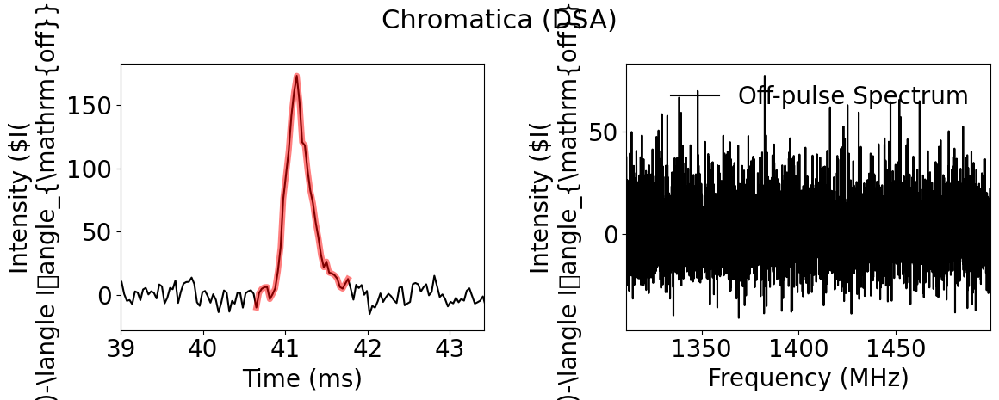

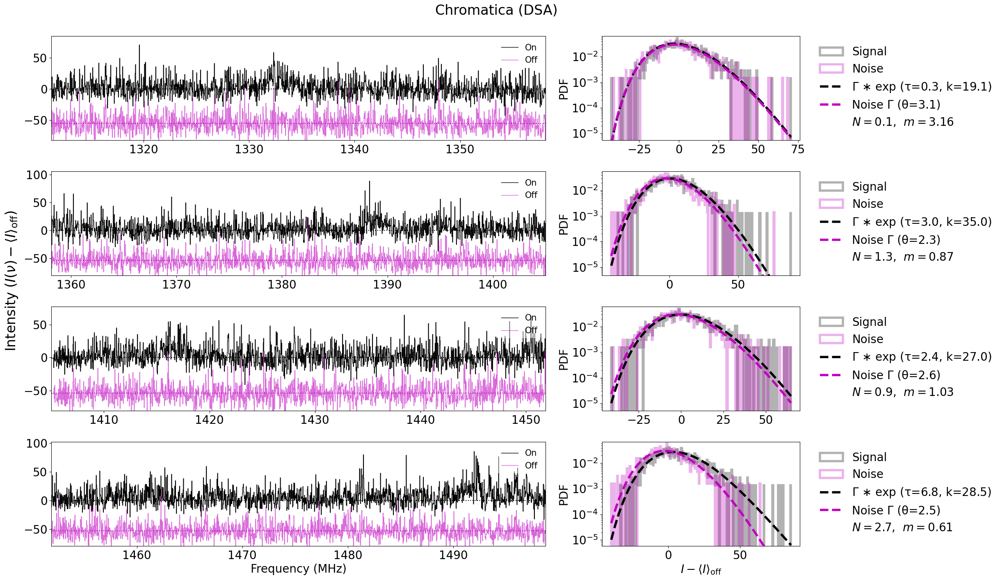

In [142]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/chromatica.npz')
data = npz['power_2d']

on = [1240, 1275]
off = [105, 140]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Chromatica (DSA)", save_path="chromatica_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3104494425.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3104494425.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


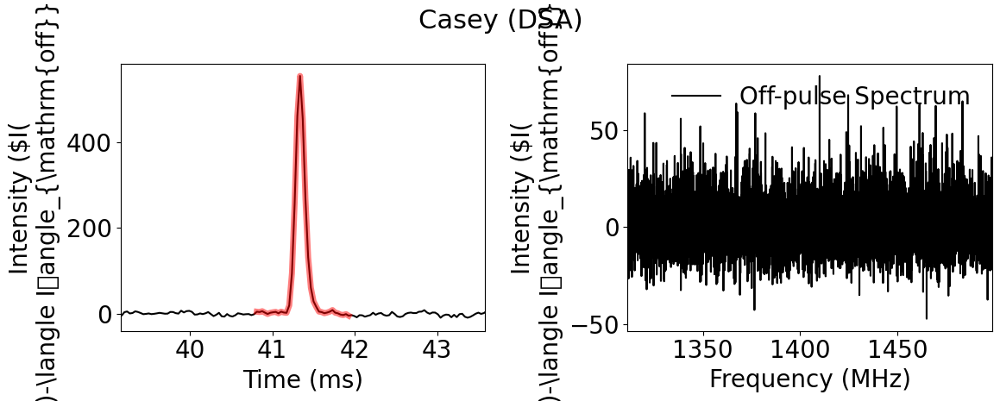

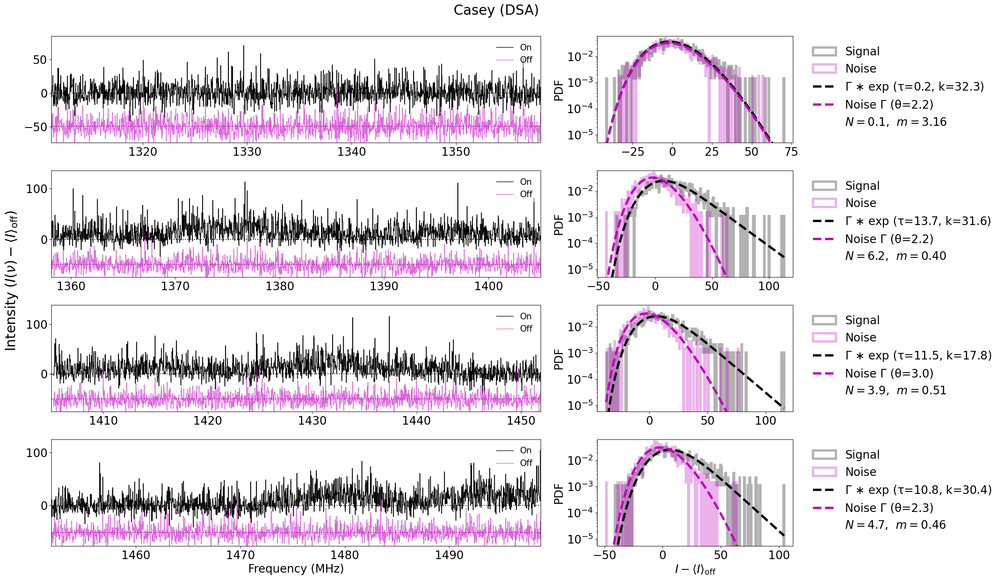

In [143]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/casey.npz')
data = npz['power_2d']

on = [1245, 1280]
off = [1115, 1145]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Casey (DSA)", save_path="casey_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3998940180.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3998940180.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


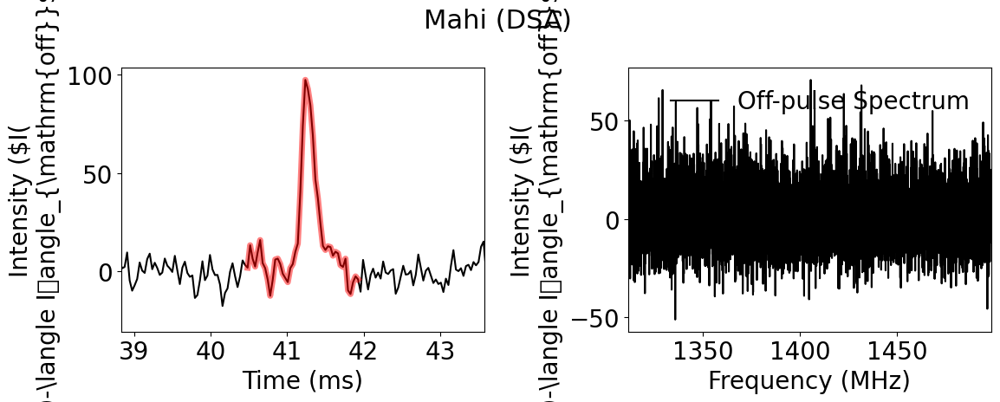

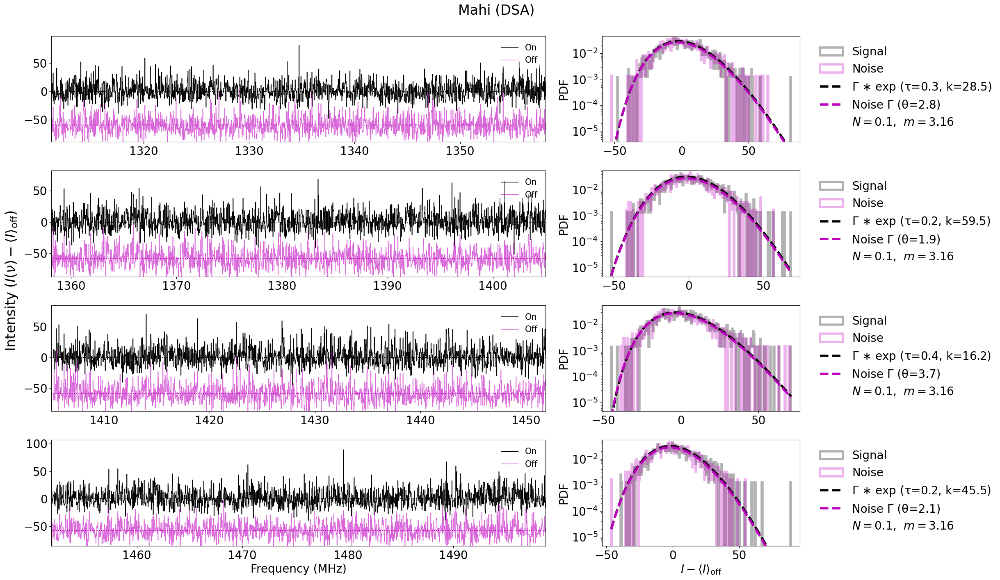

In [144]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/mahi.npz')
data = npz['power_2d']

on = [1235, 1280]
off = [1100, 1145]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}') 

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Mahi (DSA)", save_path="mahi_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/64223449.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/64223449.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


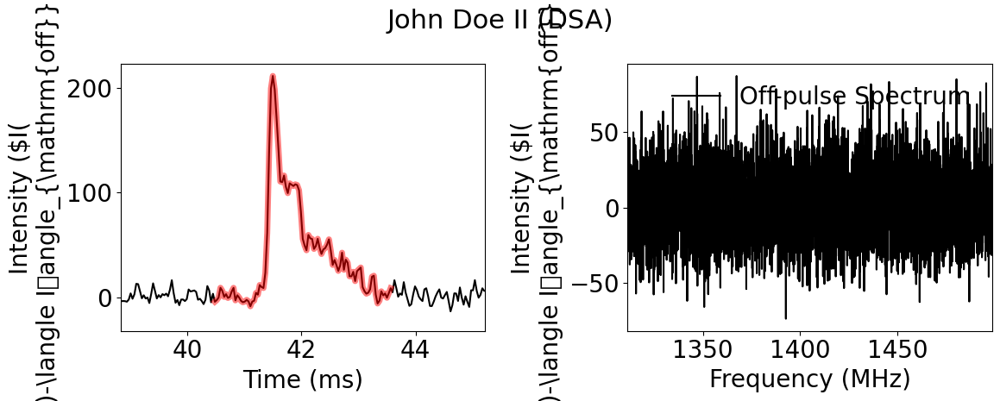

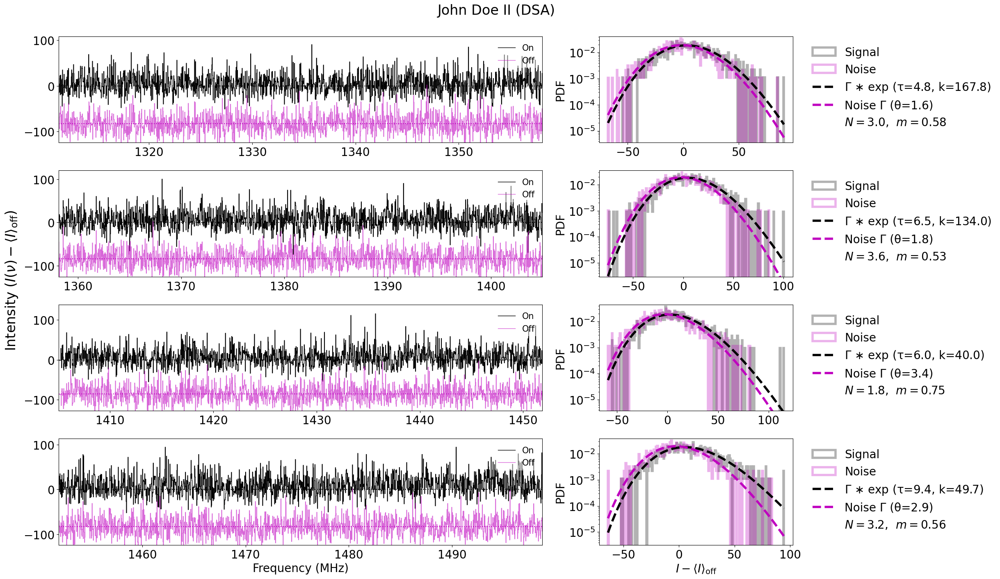

In [145]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/johndoeII.npz')
data = npz['power_2d']

on = [1235, 1330]
off = [1115, 1210]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="John Doe II (DSA)", save_path="johndoeII_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/536003264.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd
/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/536003264.py:9: RuntimeWarning: Mean of empty slice
  chmean = np.nanmean(data[i, :off[1]-off[0]])
/Users/jakobfaber/.local/share/mamba/envs/chimedsa/lib/python3.11/site-packages/numpy/lib/_nanfunctions_impl.py:2015: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


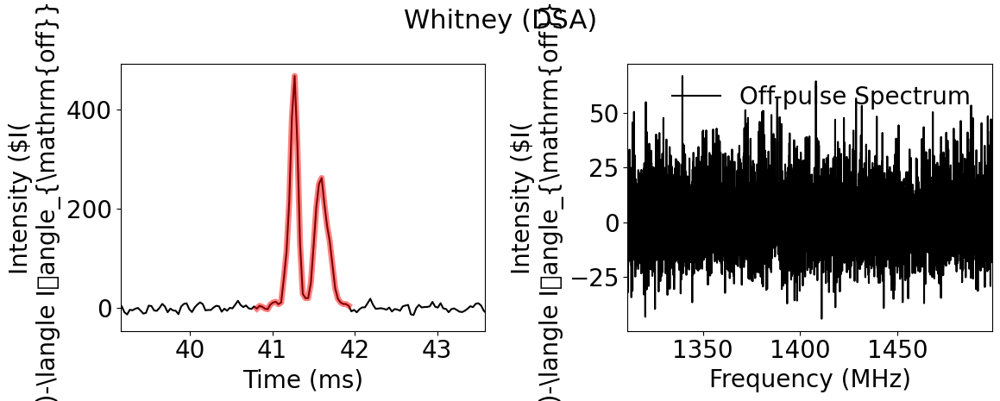

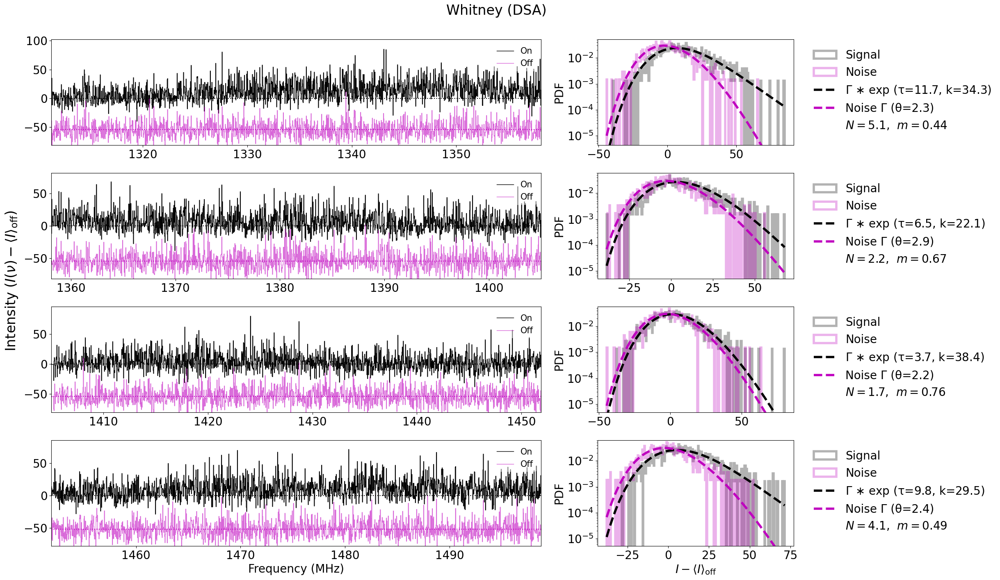

In [146]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/whitney.npz')
data = npz['power_2d']

on = [1245, 1280]
off = [115, 150]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Whitney (DSA)", save_path="whitney_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

/var/folders/8s/v8lmbgcx6d73pbwjmbf198d80000gn/T/ipykernel_9225/3401370899.py:12: RuntimeWarning: invalid value encountered in divide
  data_bpc[i, :] /= chstd


Chunks: [   0 1536 3072 4608 6144]


) missing from font(s) DejaVu Sans.198d80000gn/T/ipykernel_9225/3454567662.py:106: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.a/envs/chimedsa/lib/python3.11/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


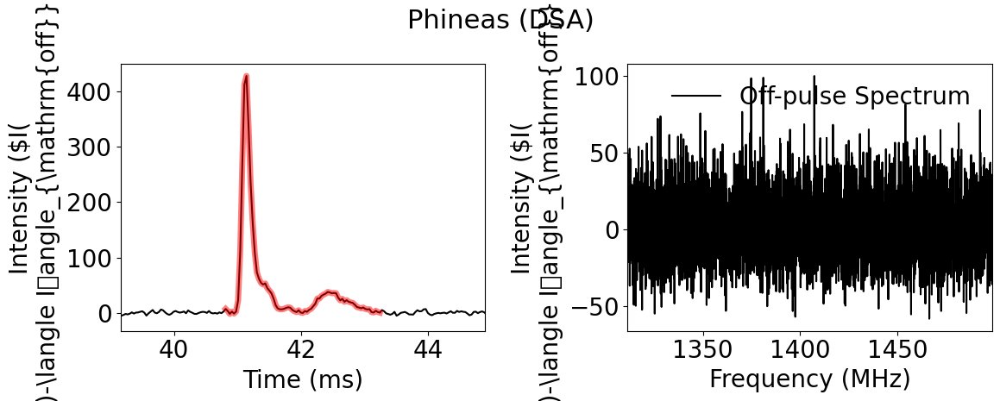

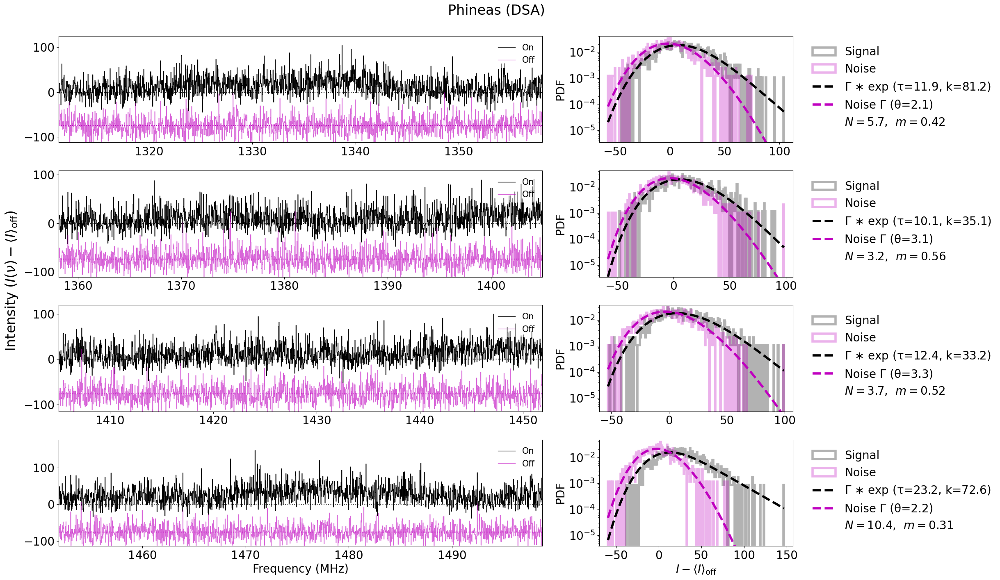

In [147]:
npz = np.load('/Users/jakobfaber/Documents/research/caltech/ovro/dsa110/chime_dsa_codetections/FLITS/scintillation/data/phineas.npz')
data = npz['power_2d']

on = [1245, 1320]
off = [115, 190]

data_bpc = np.zeros_like(data)
for i in range(6144):
    chmean = np.nanmean(data[i, :off[1]-off[0]])
    chstd = np.nanstd(data[i, :off[1]-off[0]])
    data_bpc[i, :] = data[i,:]-chmean
    data_bpc[i, :] /= chstd
data_bpc = np.nan_to_num(data_bpc, nan=0.0, posinf=0.0, neginf=0.0)

freqs = np.linspace(1311.25, 1498.75, 6144)
chunks = np.linspace(0, 6144, 5, dtype=int)
print(f'Chunks: {chunks}')

spectrum_on = np.nansum(data_bpc[:, on[0]:on[1]],axis=1)
spectrum_off = np.nansum(data_bpc[:, off[0]:off[1]],axis=1)

time = np.linspace(0,data.shape[1]*32.768e-3,data.shape[1])
timeseries = np.nansum(data,axis=0)

plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, time, timeseries, on, num_subbands=4, title="Phineas (DSA)", save_path="phineas_dsa.pdf")

#plot_spectrum_and_histograms_rice(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis")

In [148]:
#import json
#import pickle
#import numpy as np
#import matplotlib.pyplot as plt
#from scipy.odr import RealData, ODR, Model as ODRModel
#from scipy.stats import expon, norm, rice
#from scipy.signal import savgol_filter
#from scipy.optimize import curve_fit
#import logging
#    
#def plot_spectrum_and_histograms(freqs, spectrum_on, spectrum_off, num_subbands=4, title="Intensity Distribution Analysis"):
#    """
#    Creates a multi-panel plot showing spectra and fitted intensity histograms.
#    This version fits the decaying tail of the signal histogram for a better visual fit.
#    """
#    logging.info(f"Generating spectrum and histogram plot: {title}")
#    
#    # Define the models to fit directly to the histogram data
#    def gaussian_func(x, amplitude, mu, sigma):
#        return amplitude * np.exp(-((x - mu)**2) / (2 * sigma**2))
#
#    def exponential_func(x, amplitude, scale, loc):
#        x_masked = np.copy(x)
#        x_masked[x_masked < loc] = loc
#        return amplitude * np.exp(-(x_masked - loc) / scale)
#
#    fig, axes = plt.subplots(num_subbands, 2, figsize=(25, 15), width_ratios=[1, 0.2])
#    fig.suptitle(title, fontsize=20, y=1.)
#    
#    chunks = np.linspace(0, len(freqs), num_subbands + 1, dtype=int)
#
#    for i in range(num_subbands):
#        lo, hi = chunks[i], chunks[i+1]
#        ax_spec = axes[i, 0]
#        ax_hist = axes[i, 1]
#
#        # Get data chunks and remove NaNs for robust statistics and fitting
#        spec_on_chunk = spectrum_on[lo:hi][np.isfinite(spectrum_on[lo:hi])]
#        spec_off_chunk = spectrum_off[lo:hi][np.isfinite(spectrum_off[lo:hi])]
#        freq_chunk = freqs[lo:hi]
#
#        # Plot Spectra (Left Column)
#        offset = np.std(spec_on_chunk) * 4 if len(spec_on_chunk) > 0 else 1.0
#        ax_spec.step(freq_chunk, spectrum_on[lo:hi], color='k', label='On-Pulse (Signal)')
#        ax_spec.step(freq_chunk, spectrum_off[lo:hi] - offset, color='m', alpha=0.7, label='Off-Pulse (Noise)')
#        ax_spec.axhline(0, linestyle='dotted', color='k', alpha=0.5)
#        ax_spec.axhline(-offset, linestyle='dotted', color='m', alpha=0.5)
#
#        ax_spec.set_xlim(freq_chunk.min(), freq_chunk.max())
#        spec_min = np.min(spectrum_off[lo:hi] - offset) if len(spec_off_chunk) > 0 else -1
#        spec_max = np.max(spectrum_on[lo:hi]) if len(spec_on_chunk) > 0 else 1
#        ax_spec.set_ylim(spec_min * 1.1, spec_max * 1.3)
#        ax_spec.set_ylabel('Intensity', fontsize=17)
#        ax_spec.legend(loc='upper right', frameon=False, fontsize=17)
#        if i < num_subbands - 1:
#            ax_spec.set_xticklabels([])
#
#        # Plot Histograms and Fits (Right Column)
#        counts_on, bin_edges_on, _ = ax_hist.hist(spec_on_chunk, bins=50, histtype='step', color='k', linewidth=2, label='Signal')
#        bin_centers_on = (bin_edges_on[:-1] + bin_edges_on[1:]) / 2
#        
#        counts_off, bin_edges_off, _ = ax_hist.hist(spec_off_chunk, bins=50, histtype='step', color='m', linewidth=2, linestyle='--', label='Noise')
#        bin_centers_off = (bin_edges_off[:-1] + bin_edges_off[1:]) / 2
#        
#        # Create a smooth x-axis for plotting the fit curves
#        x_fit_min = np.min(bin_edges_off) if len(bin_edges_off) > 1 else 0
#        x_fit_max = np.max(bin_edges_on) if len(bin_edges_on) > 1 else 1
#        x_fit = np.linspace(x_fit_min, x_fit_max, 200)
#
#        # Fit Exponential to the TAIL of the Signal Histogram
#        if len(spec_on_chunk) > 10:
#            try:
#                # Find the peak of the histogram to define the start of the tail
#                peak_index = np.argmax(counts_on)
#                
#                # Select data to the right of the peak
#                tail_centers = bin_centers_on[peak_index:]
#                tail_counts = counts_on[peak_index:]
#                
#                # Only fit if there are enough points in the tail
#                if len(tail_centers) > 3:
#                    p0_exp = [tail_counts[0], np.std(spec_on_chunk), tail_centers[0]]
#                    popt_exp, _ = curve_fit(exponential_func, tail_centers, tail_counts, p0=p0_exp, maxfev=8000)
#                    print(f'Popt: {popt_exp}')
#                    ax_hist.plot(x_fit, exponential_func(x_fit, *popt_exp), 'g-.', lw=2, label=f'Exp. Fit (scale={popt_exp[1]:.2f})')
#                else:
#                    logging.warning(f"Not enough data points in tail to fit exponential for sub-band {i+1}")
#            except (RuntimeError, IndexError) as e:
#                logging.warning(f"Could not fit exponential to signal in sub-band {i+1}: {e}")
#
#        # Fit Gaussian to Noise Histogram (no change needed here)
#        if len(spec_off_chunk) > 10:
#            try:
#                p0_gauss = [np.max(counts_off), np.mean(spec_off_chunk), np.std(spec_off_chunk)]
#                popt_gauss, _ = curve_fit(gaussian_func, bin_centers_off, counts_off, p0=p0_gauss, maxfev=8000)
#                ax_hist.plot(x_fit, gaussian_func(x_fit, *popt_gauss), 'r:', lw=3, label=f'Gauss. Fit ($\sigma$={abs(popt_gauss[2]):.2f})')
#            except RuntimeError as e:
#                logging.warning(f"Could not fit gaussian to noise in sub-band {i+1}: {e}")
#
#        if i < num_subbands - 1:
#            ax_hist.set_xticklabels([])
#            
#        ax_hist.set_yscale('log')
#        ax_hist.set_ylim(0.5, max(popt_gauss[0], popt_exp[0])*1.245)
#        ax_hist.legend(frameon=False, fontsize=17, bbox_to_anchor=(1.85, 1.85, 0.5, 0.5))
#
#    axes[-1, 0].set_xlabel('Frequency (MHz)', fontsize=17)
#    axes[-1, 1].set_xlabel('Intensity (Counts)', fontsize=17)
#    
#    for ax_row in axes:
#        ax_row[1].set_ylabel("Counts")
#        ax_row[1].yaxis.set_label_position("right")
#        ax_row[1].yaxis.tick_right()
#        
#    for subax in axes.flatten():
#        subax.title.set_fontsize(17)
#        subax.xaxis.label.set_fontsize(17)
#        subax.yaxis.label.set_fontsize(17)
#        subax.tick_params(axis='both', labelsize=17)
#
#    fig.tight_layout() #rect=[0, 0, 1, 0.96])
#    plt.show()

In [ ]:
#import numpy as np
#import matplotlib.pyplot as plt
#from scipy.signal import savgol_filter          # smooth additive baseline
#from scipy.stats  import expon, exponnorm, norm
#from scipy.optimize import minimize
#import logging
#
#
#def plot_spectrum_and_histograms(
#        freqs,
#        spectrum_on,
#        spectrum_off,
#        num_subbands=4,
#        title="Intensity Distribution Analysis",
#        fit_mode="emg",          # "tail" | "emg"
#        tail_sigma_cut=3.0,      # threshold (σ) for tail fit
#        bins=60,
#        baseline_width_mhz=5.0,  # half–width of Savitzky-Golay window
#        sg_order=3               # polynomial order for baseline
#):
#    """
#    1. Fit a smooth Savitzky–Golay baseline to the *on-pulse* spectrum.
#    2. Subtract that baseline from both on-pulse and off-pulse data.
#    3. Inside each sub-band subtract the off-pulse mean, estimate σ_n, and
#       fit either the high tail or the full exponentially-modified Gaussian.
#    """
#
#    # -- 0. add-mode baseline -------------------------------------------------
#    chan_w = np.median(np.diff(freqs))                      # MHz per channel
#    win_ch = max( 3*sg_order+1,
#                  int(round(baseline_width_mhz/chan_w)) | 1)  # odd length
#    baseline = savgol_filter(spectrum_on, win_ch, sg_order, mode="mirror")
#
#    spec_on_bl  = spectrum_on  - baseline
#    spec_off_bl = spectrum_off - baseline
#
#    # ------------------------------------------------------------------------
#    logging.info(f"[plot] mode={fit_mode}, additive baseline span "
#                 f"{baseline_width_mhz} MHz (window {win_ch} ch)")
#
#    fig, axes = plt.subplots(num_subbands, 2,
#                             figsize=(25, 15),
#                             width_ratios=[1.0, 0.28])
#    fig.suptitle(title, fontsize=22)
#
#    edges = np.linspace(0, len(freqs), num_subbands + 1, dtype=int)
#
#    for i in range(num_subbands):
#        lo, hi = edges[i], edges[i+1]
#        ax_spec, ax_hist = axes[i]
#
#        # ---- 1. slice and clean -------------------------------------------
#        on_chunk  = np.asarray(spec_on_bl [lo:hi], dtype=float)
#        off_chunk = np.asarray(spec_off_bl[lo:hi], dtype=float)
#        good_on   = np.isfinite(on_chunk)
#        good_off  = np.isfinite(off_chunk)
#        if good_on.sum() < 10 or good_off.sum() < 10:
#            logging.warning(f"Sub-band {i+1}: too few valid points → skipped")
#            continue
#        on_chunk, off_chunk = on_chunk[good_on], off_chunk[good_off]
#        freq_chunk          = freqs[lo:hi][good_on]
#
#        # ---- 2. baseline-subtract off-pulse mean & get σ_n -----------------
#        noise_mean = np.nanmean(off_chunk)
#        sigma_n    = np.nanstd (off_chunk, ddof=1)
#
#        spec_on_d  = on_chunk  - noise_mean
#        spec_off_d = off_chunk - noise_mean
#        samples    = spec_on_d
#
#        m_val = np.nanstd(samples) / np.nanmean(samples)
#        logging.debug(f"Sub-band {i+1}: σ_n={sigma_n:.3g}, m={m_val:.2f}")
#
#        # ---- 3. spectrum panel --------------------------------------------
#        offset = 4 * sigma_n
#        ax_spec.step(freq_chunk, spec_on_d,           color='k', label='On')
#        ax_spec.step(freq_chunk, spec_off_d - offset, color='m', alpha=0.6,
#                     label='Off (shifted)')
#        ax_spec.axhline(0,        ls=':', color='k', alpha=0.4)
#        ax_spec.axhline(-offset,  ls=':', color='m', alpha=0.4)
#        ax_spec.set_xlim(freq_chunk.min(), freq_chunk.max())
#        ax_spec.set_ylim(-offset - 2*sigma_n,
#                         np.percentile(spec_on_d, 99)*1.2)
#        if i < num_subbands-1:
#            ax_spec.set_xticklabels([])
#        ax_spec.set_ylabel("Baseline-subtracted I", fontsize=14)
#        ax_spec.legend(frameon=False, fontsize=12)
#
#        # ---- 4. histogram --------------------------------------------------
#        h_on,  e_on,  _ = ax_hist.hist(samples,    bins=bins,
#                                       density=True, histtype='step',
#                                       color='k', lw=2, label='Signal')
#        h_off, e_off, _ = ax_hist.hist(spec_off_d, bins=bins,
#                                       density=True, histtype='step',
#                                       color='m', lw=2, ls='--', label='Noise')
#        x_min = min(e_on[0], e_off[0])
#        x_max = max(e_on[-1], e_off[-1])
#        x_plot = np.linspace(x_min, x_max, 400)
#
#        # ---- 5. fit & overlay ---------------------------------------------
#        if fit_mode.lower() == "tail":
#            tail = samples[samples > tail_sigma_cut*sigma_n]
#            if len(tail) >= 10:
#                tau_hat = tail.mean()
#                ax_hist.plot(x_plot,
#                             expon(scale=tau_hat).pdf(x_plot),
#                             'g-', lw=2,
#                             label=rf'exp-tail ($\tau={tau_hat:.2f}$)')
#        elif fit_mode.lower() == "emg":
#            def nll(par, data, sig):
#                loc, k = par
#                if k <= 0:
#                    return np.inf
#                return -np.sum(exponnorm.logpdf(data, K=k, loc=loc, scale=sig))
#            res = minimize(nll, x0=[np.median(samples), 1.0],
#                           args=(samples, sigma_n),
#                           bounds=[(-np.inf, np.inf), (1e-3, 50)],
#                           method="L-BFGS-B")
#            loc_hat, K_hat = res.x
#            tau_hat = K_hat * sigma_n
#            ax_hist.plot(x_plot,
#                         exponnorm.pdf(x_plot, K_hat, loc=loc_hat, scale=sigma_n),
#                         'g-', lw=2,
#                         label=rf'EMG ($\tau={tau_hat:.2f}$, σ={sigma_n:.2f}, '
#                               rf'loc={loc_hat:.2f})')
#        else:
#            raise ValueError("fit_mode must be 'tail' or 'emg'")
#
#        # ---- 6. noise PDF overlay -----------------------------------------
#        ax_hist.plot(x_plot, norm(scale=sigma_n).pdf(x_plot),
#                     'r:', lw=2, label=rf'Noise $N(0,{sigma_n:.2f}\!^2)$')
#
#        # ---- 7. styling ----------------------------------------------------
#        ax_hist.set_yscale('log')
#        y_max = max(h_on.max(), h_off.max())
#        ax_hist.set_ylim(y_max*1e-4, y_max*1.2)
#        if i == num_subbands//2:
#            ax_hist.set_ylabel("PDF", fontsize=14)
#        ax_hist.legend(frameon=False, fontsize=11)
#
#    axes[-1, 0].set_xlabel("Frequency (MHz)", fontsize=15)
#    axes[-1, 1].set_xlabel(r"$I_{\rm bl}-\langle I\rangle_{\rm off}$",
#                           fontsize=15)
#    fig.tight_layout(rect=[0, 0, 1, 0.965])
#    plt.show()
#